### Loading Required Libraries

In [1]:
import os
import pandas as pd
import pickle
import numpy as np
import seaborn as sns
import secrets
import cv2
from PIL import Image
from PIL import ImageFile
from sklearn.datasets import load_files
from keras.utils import np_utils
import matplotlib.pyplot as plt
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential
from keras.models import Sequential,Model
from keras.utils.vis_utils import plot_model
from keras.callbacks import ModelCheckpoint
from keras.utils import to_categorical
from sklearn.metrics import confusion_matrix
from keras.preprocessing import image                  
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import shutil
from tensorflow import keras

In [2]:
from PIL import ImageFile   
from sklearn.model_selection import train_test_split
from keras.preprocessing import image                  
from tqdm import tqdm
from keras import optimizers
from keras.applications.vgg16 import VGG16
import seaborn as sns
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

#### Setting up directories

In [5]:
TEST_DIR = os.path.join(os.getcwd(),"imgs","test")
TRAIN_DIR = os.path.join(os.getcwd(),"imgs","train")
MODEL_PATH = os.path.join(os.getcwd(),"model","self_trained")
PICKLE_DIR = os.path.join(os.getcwd(),"pickle_files")
CSV_DIR = os.path.join(os.getcwd(),"csv_files")

In [4]:
if not os.path.exists(TEST_DIR):
    print("Testing data does not exists")
if not os.path.exists(TRAIN_DIR):
    print("Training data does not exists")
if not os.path.exists(MODEL_PATH):
    print("Model path does not exists")
    os.makedirs(MODEL_PATH)
    print("Model path created")
if not os.path.exists(PICKLE_DIR):
    os.makedirs(PICKLE_DIR)
if not os.path.exists(CSV_DIR):
    os.makedirs(CSV_DIR)

### Data Preparation

Create csv files for the training and testing data 

In [5]:
def create_csv(DATA_DIR,filename):
    class_names = os.listdir(DATA_DIR)
    data = list()
    if(os.path.isdir(os.path.join(DATA_DIR,class_names[0]))):
        for class_name in class_names:
            file_names = os.listdir(os.path.join(DATA_DIR,class_name))
            for file in file_names:
                data.append({
                    "Filename":os.path.join(DATA_DIR,class_name,file),
                    "ClassName":class_name
                })
    else:
        class_name = "test"
        file_names = os.listdir(DATA_DIR)
        for file in file_names:
            data.append(({
                "FileName":os.path.join(DATA_DIR,file),
                "ClassName":class_name
            }))
    data = pd.DataFrame(data)
    data.to_csv(os.path.join(os.getcwd(),"csv_files",filename),index=False)

create_csv(TRAIN_DIR,"train.csv")
create_csv(TEST_DIR,"test.csv")


In [6]:
data_train = pd.read_csv(os.path.join(os.getcwd(),"csv_files","train.csv"))
data_test = pd.read_csv(os.path.join(os.getcwd(),"csv_files","test.csv"))

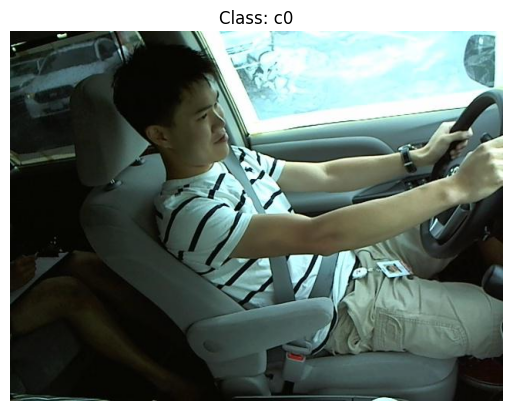

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the CSV file into a DataFrame

# Select an instance to view (e.g., the first row)
sample_instance = data_train.loc[4, "Filename"]

# Display the image
img = mpimg.imread(sample_instance)
plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.title(f"Class: {data_train.loc[4, 'ClassName']}")
plt.show()


In [8]:
data_train['ClassName'].value_counts()

ClassName
c0    2489
c3    2346
c4    2326
c6    2325
c2    2317
c5    2312
c1    2267
c9    2129
c7    2002
c8    1911
Name: count, dtype: int64

### Looking at the class distribution

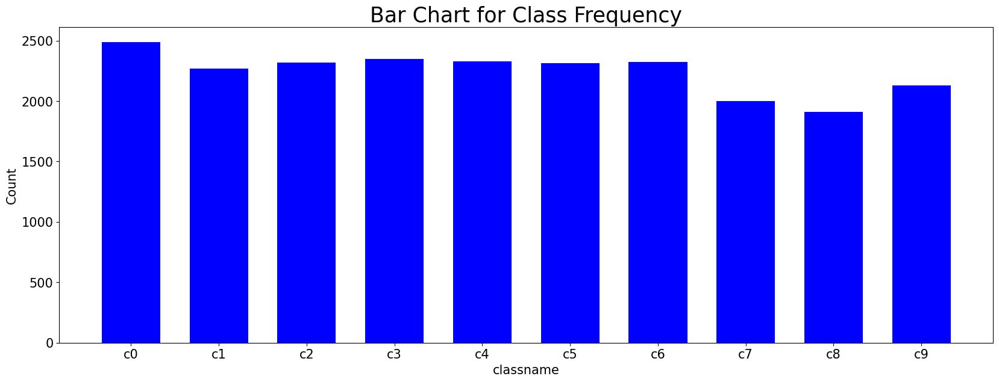

In [9]:
nf = data_train['ClassName'].value_counts(sort=False)
labels = data_train['ClassName'].value_counts(sort=False).index.tolist()
y = np.array(nf)
width = 1/1.5
N = len(y)
x = range(N)

fig = plt.figure(figsize=(20,15))
ay = fig.add_subplot(211)

plt.xticks(x, labels, size=15)
plt.yticks(size=15)

ay.bar(x, y, width, color="blue")

plt.title('Bar Chart for Class Frequency',size=25)
plt.xlabel('classname',size=15)
plt.ylabel('Count',size=15)

plt.show()

In [10]:
data_test.shape

(79726, 2)

In [11]:
labels_list = list(set(data_train['ClassName'].values.tolist()))
labels_list

['c7', 'c5', 'c3', 'c9', 'c1', 'c8', 'c2', 'c6', 'c4', 'c0']

In [12]:
for id,label_name in enumerate(labels_list):
    print(id,label_name)

0 c7
1 c5
2 c3
3 c9
4 c1
5 c8
6 c2
7 c6
8 c4
9 c0


In [13]:
labels_id = {label_name:id for id,label_name in enumerate(labels_list)}


In [14]:
labels_id

{'c7': 0,
 'c5': 1,
 'c3': 2,
 'c9': 3,
 'c1': 4,
 'c8': 5,
 'c2': 6,
 'c6': 7,
 'c4': 8,
 'c0': 9}

In [15]:
data_train['ClassName'].replace(labels_id, inplace=True)


In [16]:
with open(os.path.join(os.getcwd(),"pickle_files","labels_list.pkl"),"wb") as handle:
    pickle.dump(labels_id,handle)

#### Converting the labels to one-hot vector before passing into the model

In [17]:
labels = to_categorical(data_train['ClassName'])
print(labels.shape)

(22424, 10)


In [18]:
labels = np.array(labels)

In [19]:
import pandas as pd
import cv2
import numpy as np

# Load the CSV file into a DataFrame
  # Replace "train.csv" with the actual path to your CSV file

# Initialize constants
image_size = (64, 64)  # Adjust this size as needed

# Initialize empty NumPy arrays to store images and labels
X_train = np.empty((len(data_train), *image_size, 3), dtype=np.uint8)
y_train = np.empty(len(data_train), dtype=int)



In [20]:
for i, row in data_train.iterrows():
    image_path = row['Filename']  # Assuming "Filename" is the column name with image paths
    img = cv2.imread(image_path)
    img = cv2.resize(img, image_size)
    X_train[i, :, :, :] = img.astype(np.float32)  # Convert to float32
    y_train[i] = row['ClassName']  # Assuming "ClassName" is the column name with class labels

# Reshape X_train to add the batch dimension
X_train = X_train.reshape(-1, *image_size, 3)

#### Applying Data Augmentation

In [21]:
rotation_range = 5
width_shift_range = 0.02
height_shift_range = 0.02
shear_range = 0.01
zoom_range = 0.05
horizontal_flip = False
fill_mode = "nearest"

In [22]:
def increase_brightness(img, value):
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    lim = 255 - value
    v[v > lim] = 255
    v[v <= lim] += value

    final_hsv = cv2.merge((h, s, v))
    img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
    return img

In [23]:
def change_contrast(img, level):
    img = Image.fromarray(img.astype('uint8'))
    factor = (259 * (level + 255)) / (255 * (259 - level))
    def contrast(c):
        return 128 + factor * (c - 128)
    return np.array(img.point(contrast))


In [24]:
def preprocess_img(img):
    img = np.array(img)

    x = secrets.randbelow(2)

    if x == 0:
        # img = pad_img(img)
        img = increase_brightness(img, secrets.randbelow(26))
        img = change_contrast(img, secrets.randbelow(51))
    else:
        # img = pad_img(img)
        img = change_contrast(img, secrets.randbelow(51))
        img = increase_brightness(img, secrets.randbelow(26))

    return img

In [25]:
BATCH_SIZE = 64
IMAGE_SIZE = 224
NUM_EPOCH = 25

In [26]:
datagen = ImageDataGenerator(
        rotation_range = rotation_range,
        width_shift_range = width_shift_range,
        height_shift_range = height_shift_range,
        shear_range = shear_range,
        zoom_range = zoom_range,
        horizontal_flip = horizontal_flip,
        fill_mode = fill_mode,
        validation_split = 0.2,
        preprocessing_function = preprocess_img)

In [27]:
TEST_DIR = os.path.join(os.getcwd(),"imgs","test")
TRAIN_DIR = os.path.join(os.getcwd(),"imgs","train")

In [28]:
train_data = datagen.flow_from_directory(TRAIN_DIR,
                                        target_size=(IMAGE_SIZE,IMAGE_SIZE),
                                        batch_size=BATCH_SIZE,
                                        subset='training',shuffle=True)

valid_data = datagen.flow_from_directory(TRAIN_DIR,
                                        target_size=(IMAGE_SIZE,IMAGE_SIZE),
                                        batch_size=BATCH_SIZE,
                                        subset='validation',shuffle=True)

Found 17943 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.


### Model Building 

## Building a CNN model from scratch

In [29]:
model = Sequential()
#use glorot normal to avoid vanishing gradient
model.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu', input_shape=(IMAGE_SIZE,IMAGE_SIZE,3), kernel_initializer='glorot_normal'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=128, kernel_size=2, padding='same', activation='relu', kernel_initializer='glorot_normal'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=256, kernel_size=2, padding='same', activation='relu', kernel_initializer='glorot_normal'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=512, kernel_size=2, padding='same', activation='relu', kernel_initializer='glorot_normal'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.5))
model.add(Flatten())
#model.add(Dense(500, activation='relu', kernel_initializer='glorot_normal'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax', kernel_initializer='glorot_normal'))
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      832       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 128)     32896     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 256)       131328    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 256)      0

In [30]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [31]:
filepath = os.path.join(MODEL_PATH,"distracted-{epoch:02d}-{val_accuracy:.2f}.hdf5")
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]

In [32]:
model_history = model.fit(train_data,validation_data = valid_data,epochs=25,callbacks=callbacks_list, batch_size=64)

Epoch 1/25
281/281 [==============================] - ETA: 0s - loss: 4.2555 - accuracy: 0.4404
Epoch 1: val_accuracy improved from -inf to 0.82504, saving model to C:\Users\Gunjan Joshi\Desktop\Deep Learning\Distracted Driver\state-farm-distracted-driver-detection\model\self_trained\distracted-01-0.83.hdf5
281/281 [==============================] - 204s 709ms/step - loss: 4.2555 - accuracy: 0.4404 - val_loss: 0.5492 - val_accuracy: 0.8250
Epoch 2/25
281/281 [==============================] - ETA: 0s - loss: 0.5788 - accuracy: 0.8151
Epoch 2: val_accuracy improved from 0.82504 to 0.92435, saving model to C:\Users\Gunjan Joshi\Desktop\Deep Learning\Distracted Driver\state-farm-distracted-driver-detection\model\self_trained\distracted-02-0.92.hdf5
281/281 [==============================] - 192s 685ms/step - loss: 0.5788 - accuracy: 0.8151 - val_loss: 0.2553 - val_accuracy: 0.9243
Epoch 3/25
281/281 [==============================] - ETA: 0s - loss: 0.3539 - accuracy: 0.8954
Epoch 3: val_

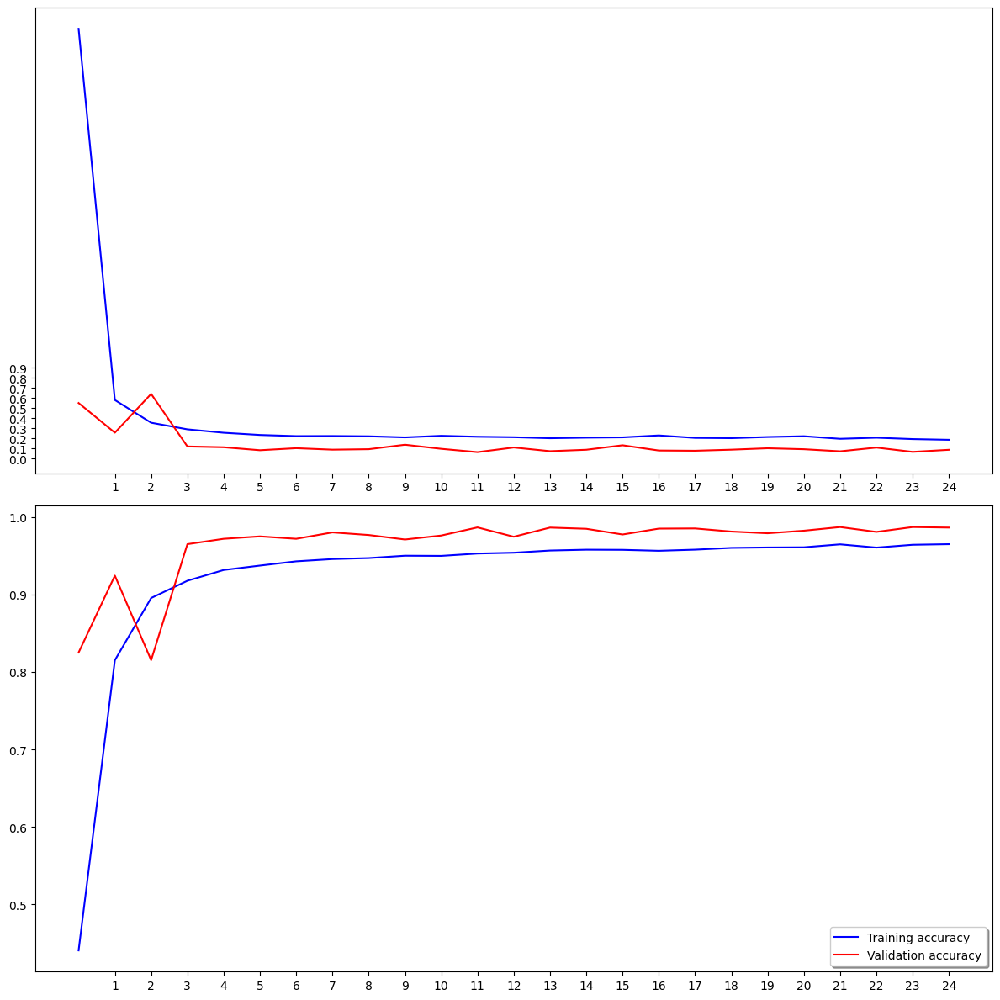

In [33]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))
ax1.plot(model_history.history['loss'], color='b', label="Training loss")
ax1.plot(model_history.history['val_loss'], color='r', label="validation loss")
ax1.set_xticks(np.arange(1, 25, 1))
ax1.set_yticks(np.arange(0, 1, 0.1))

ax2.plot(model_history.history['accuracy'], color='b', label="Training accuracy")
ax2.plot(model_history.history['val_accuracy'], color='r',label="Validation accuracy")
ax2.set_xticks(np.arange(1, 25, 1))

legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

## Testing Accuracy

In [3]:
from tensorflow.keras.models import load_model

best_model_path = 'model/self_trained/distracted-22-0.99.hdf5'

# Load the model
model = load_model(best_model_path)

# Now you can use the model for predictions or further training


In [ ]:
from tensorflow.keras.models import load_model
import cv2
import numpy as np
import pandas as pd

# Constants
IMAGE_SIZE = 224  # as used in your training
BATCH_SIZE = 64   # as used in your training

# Load the test data
data_test = pd.read_csv(os.path.join(os.getcwd(),"csv_files","test.csv"))
X_test = []
y_test = []

for i, row in data_test.iterrows():
    image_path = row['FileName']
    img = cv2.imread(image_path)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
    X_test.append(img.astype(np.float32))
    #y_test.append(labels_id[row['ClassName']]) # Assuming 'ClassName' is the column name

# Convert lists to NumPy arrays
X_test = np.array(X_test)
#y_test = np.array(y_test)

# Preprocess X_test as done with X_train
X_test = X_test / 255.0  # If you normalized training data

# Convert labels to categorical (one-hot encoding)
y_test = to_categorical(y_test, num_classes=len(labels_id))

# Load the best model
best_model_path = 'model/self_trained/distracted-22-0.99.hdf5'
model = load_model(best_model_path)
predictions = model.predict(X_test)





In [38]:
data_test

,FileName,ClassName
0,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
1,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
2,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
3,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
4,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
...,...,...
79721,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
79722,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
79723,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test
79724,C:\Users\Gunjan Joshi\Desktop\Deep Learning\Di...,test


1/1 [==============================] - ETA: 0s

C:\Users\Gunjan Joshi\AppData\Local\Temp\ipykernel_3996\4205551751.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


1/1 [==============================] - 0s 15ms/step


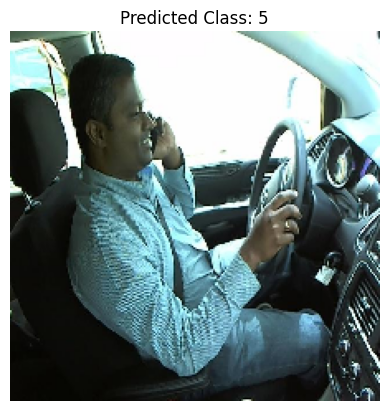

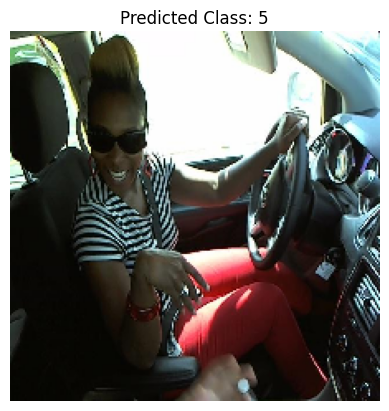

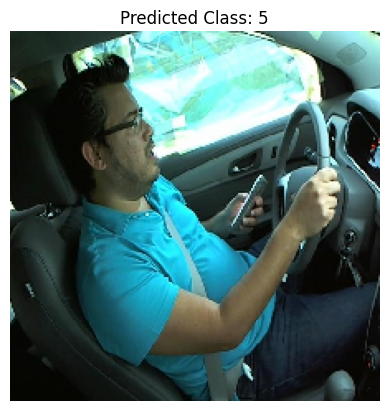

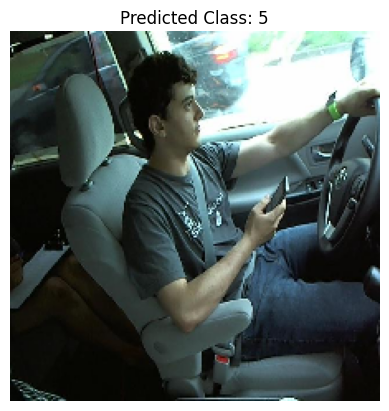

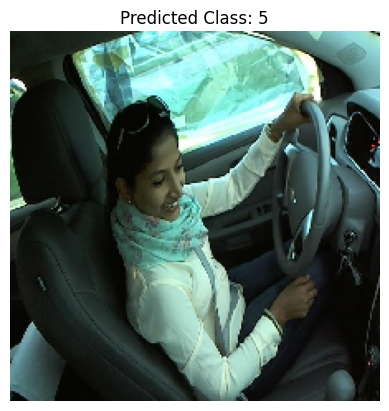

...

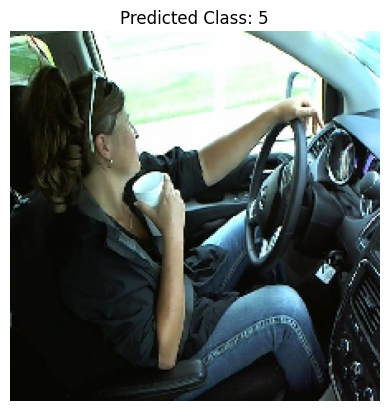

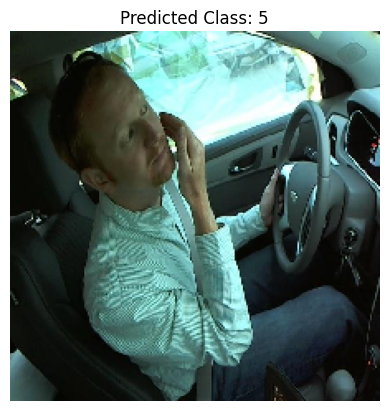

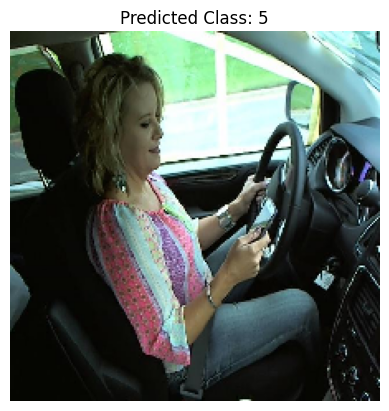

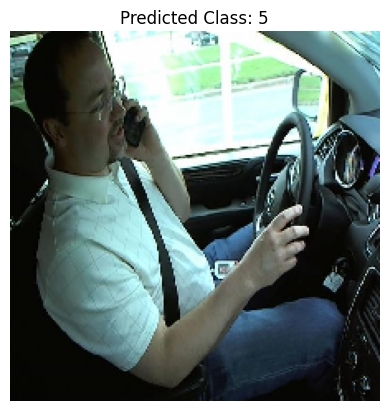

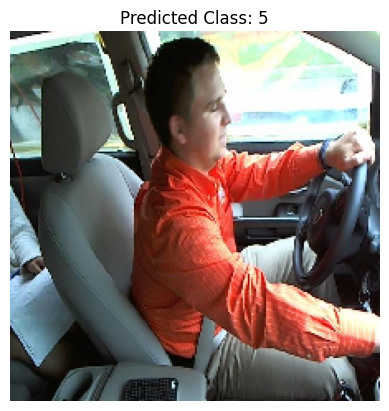

In [9]:
import os
import random
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Directory containing test images
# Select 5 random images from the test directory
selected_images = random.sample(os.listdir(TEST_DIR), 50)

# Preprocess and make predictions for each selected image
for image_name in selected_images:
    # Load and preprocess the image
    img_path = os.path.join(TEST_DIR, image_name)
    img = image.load_img(img_path, target_size=(64, 64))  # Adjust target_size as per your model's input shape
    img_array = image.img_to_array(img)
    img_array = img_array / 255.0  # Normalize the image
    img_array = img_array.reshape((1, *img_array.shape))  # Add batch dimension

    # Make prediction
    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)

    # Visualize the image and its predicted class
    plt.figure()
    plt.imshow(img)
    plt.title(f"Predicted Class: {predicted_class}")
    plt.axis('off')

plt.show()
